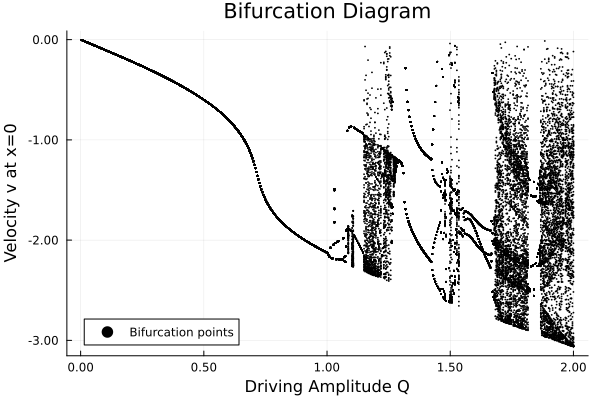

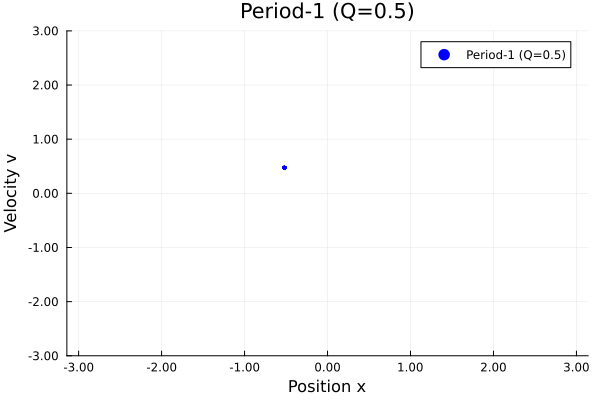

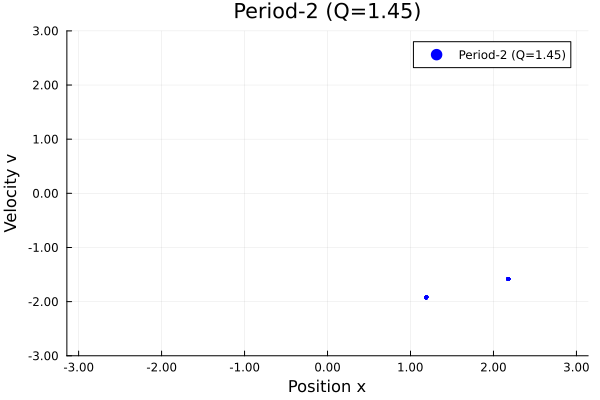

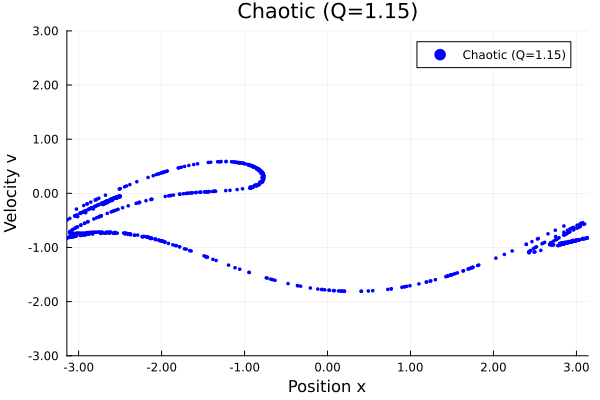

In [1]:
# Task 3.1a)

using Plots
using Printf

# --- Parameters ---
const k = 1.0
const gamma = 0.5
const Omega = 2/3
const T0 = 2 * pi / Omega
const dt = T0 / 200

# --- ODE System ---
function derivatives(x, v, Q, t)
    dx = v
    dv = -k * sin(x) - gamma * v + Q * sin(Omega * t)
    return dx, dv
end

# --- RK4 Stepper ---
function rk4_step(x, v, Q, t, dt)
    k1_x, k1_v = derivatives(x, v, Q, t)
    k2_x, k2_v = derivatives(x + 0.5*dt*k1_x, v + 0.5*dt*k1_v, Q, t + 0.5*dt)
    k3_x, k3_v = derivatives(x + 0.5*dt*k2_x, v + 0.5*dt*k2_v, Q, t + 0.5*dt)
    k4_x, k4_v = derivatives(x + dt*k3_x, v + dt*k3_v, Q, t + dt)
    
    x_new = x + (dt/6.0) * (k1_x + 2*k2_x + 2*k3_x + k4_x)
    v_new = v + (dt/6.0) * (k1_v + 2*k2_v + 2*k3_v + k4_v)
    
    return x_new, v_new
end

# Helper function to keep angle within [-pi, pi)
wrap_angle(x) = mod(x + pi, 2*pi) - pi

# --- Task 1: Bifurcation Diagram ---
function generate_bifurcation()
    Q_vals = range(0.0, 2.0, length=500)
    plot_Q = Float64[]
    plot_v = Float64[]
    
    for Q in Q_vals
        x, v, t = 1.0, 0.0, 0.0
        
        # Burn-in phase (100 periods)
        for _ in 1:(100 * 200)
            x, v = rk4_step(x, v, Q, t, dt)
            t += dt
        end
        
        # Recording phase (100 periods)
        for _ in 1:(100 * 200)
            x_old, v_old = x, v
            x, v = rk4_step(x, v, Q, t, dt)
            t += dt
            
            x_wrapped_old = wrap_angle(x_old)
            x_wrapped_new = wrap_angle(x)
            
            # Detect crossing from positive to negative
            if x_wrapped_old > 0.0 && x_wrapped_new < 0.0 && (x_wrapped_old - x_wrapped_new) < pi
                # Linear interpolation for exact crossing velocity
                frac = x_wrapped_old / (x_wrapped_old - x_wrapped_new)
                v_cross = v_old + frac * (v - v_old)
                
                push!(plot_Q, Q)
                push!(plot_v, v_cross)
            end
        end
    end
    
    return scatter(plot_Q, plot_v, markersize=1, markerstrokewidth=0, color=:black,
                   label="Bifurcation points", legend=:bottomleft,
                   xformatter = x -> @sprintf("%.2f", x),
                   yformatter = y -> @sprintf("%.2f", y),
                   xlabel="Driving Amplitude Q", ylabel="Velocity v at x=0",
                   title="Bifurcation Diagram")
end


# --- Task 2 & 3: Stroboscopic Maps ---
function generate_stroboscopic(Q, title_str; legend_pos = :topright)
    x, v, t = 1.0, 0.0, 0.0
    plot_x = Float64[]
    plot_v = Float64[]
    
    # Burn-in phase (200 periods)
    for _ in 1:(200 * 200)
        x, v = rk4_step(x, v, Q, t, dt)
        t += dt
    end
    
    # Recording phase (1000 periods to get a good scatter map)
    for _ in 1:(1000)
        # Integrate for exactly one driving period (200 steps)
        for _ in 1:200
            x, v = rk4_step(x, v, Q, t, dt)
            t += dt
        end
        # Record stroboscopic point
        push!(plot_x, wrap_angle(x))
        push!(plot_v, v)
    end
    

    return scatter(plot_x, plot_v, markersize=2, markerstrokewidth=0, color=:blue,
                   label=title_str, legend=legend_pos,
                   xlims=(-pi, pi),
                   ylims=(-3.0, 3.0),
                   xformatter = x -> @sprintf("%.2f", x),
                   yformatter = y -> @sprintf("%.2f", y),
                   xlabel="Position x", ylabel="Velocity v",
                   title=title_str)
end



# --- Execute and Plot ---
p_bifurcation = generate_bifurcation()

p_period1 = generate_stroboscopic(0.5, "Period-1 (Q=0.5)")
p_period2 = generate_stroboscopic(1.45, "Period-2 (Q=1.45)", legend_pos = :topright)
p_chaos   = generate_stroboscopic(1.15, "Chaotic (Q=1.15)", legend_pos = :topright)

# Display each plot individually
display(p_bifurcation)
display(p_period1)
display(p_period2)
display(p_chaos)


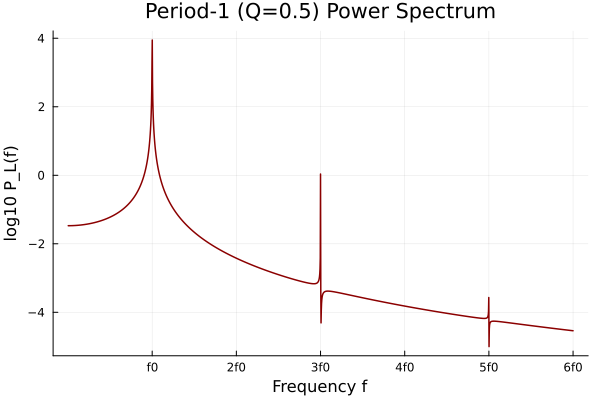

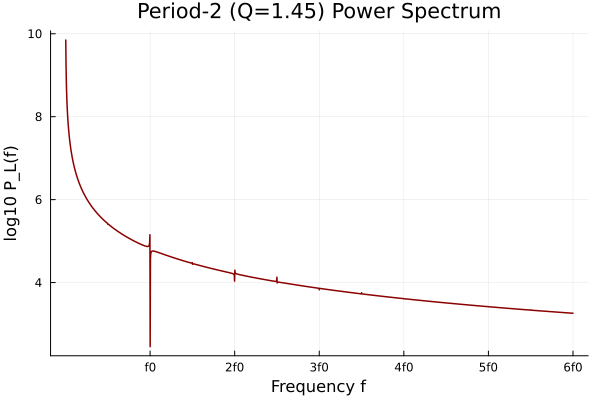

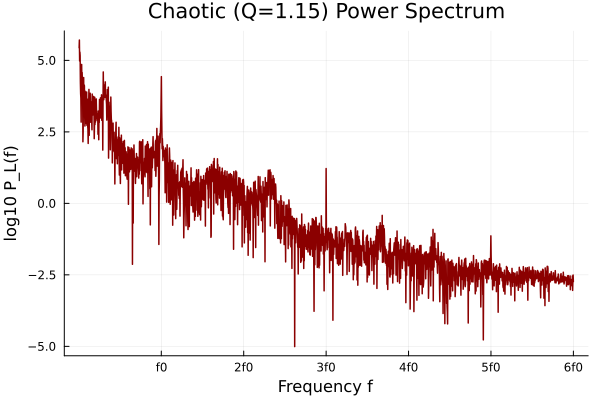

In [38]:
# Task 3.1b)

using Plots
using FFTW
using Statistics
using Printf

# --- Parameters ---
const k = 1.0
const gamma = 0.5
const Omega = 2/3
const T0 = 2 * pi / Omega
const dt = T0 / 200
const f0 = Omega / (2 * pi) # driving frequency in Hz

# --- RK4 ---
function derivatives(x, v, Q, t)
    dx = v
    dv = -k * sin(x) - gamma * v + Q * sin(Omega * t)
    return dx, dv
end

function rk4_step(x, v, Q, t, dt)
    k1_x, k1_v = derivatives(x, v, Q, t)
    k2_x, k2_v = derivatives(x + 0.5*dt*k1_x, v + 0.5*dt*k1_v, Q, t + 0.5*dt)
    k3_x, k3_v = derivatives(x + 0.5*dt*k2_x, v + 0.5*dt*k2_v, Q, t + 0.5*dt)
    k4_x, k4_v = derivatives(x + dt*k3_x, v + dt*k3_v, Q, t + dt)
    
    x_new = x + (dt/6.0) * (k1_x + 2*k2_x + 2*k3_x + k4_x)
    v_new = v + (dt/6.0) * (k1_v + 2*k2_v + 2*k3_v + k4_v)
    return x_new, v_new
end

# --- Fourier Analysis ---
function plot_power_spectrum(Q, title_str; N=2^16, burn_in_periods=200)
    x, v = 1.0, 0.0
    step_count = 0
    
    # 1. Burn-in Phase
    for _ in 1:(burn_in_periods * 200)
        t = step_count * dt
        x, v = rk4_step(x, v, Q, t, dt)
        step_count += 1
    end
    
    # 2. Collect data for FFT
    x_data = zeros(Float64, N)
    for i in 1:N
        t = step_count * dt
        x, v = rk4_step(x, v, Q, t, dt)
        # no wrap_angle(x) steady signal is needed for FFT
        x_data[i] = x 
        step_count += 1
    end
    
    # 3. Subtract mean (removes the f=0 DC component)
    x_data .-= mean(x_data)
    
    # 4. FFT and Periodogram calculation
    x_fft = fft(x_data)
    P_L = (abs.(x_fft).^2) ./ N  # P_L(f) Definition
    
    # 5. Frequency bins calculation
    fs = 1.0 / dt  # Abtastrate (Sampling Frequency)
    freqs = (0:N-1) .* (fs / N)
    
    # 6. filter frequencies up to 6*f0 (and only the positive half of the spectrum)
    valid_indices = findall(f -> 0 < f <= 6 * f0, freqs[1:div(N,2)])
    
    plot_freqs = freqs[valid_indices]
    
    # calculate log P_L(f)
    plot_power = log10.(P_L[valid_indices] .+ 1e-20)
    
    # generate plot
    return plot(plot_freqs, plot_power, linewidth=1.5, color=:darkred,
                xlabel="Frequency f", ylabel="log10 P_L(f)",
                title=title_str, legend=false,
                xticks=([f0, 2*f0, 3*f0, 4*f0, 5*f0, 6*f0], 
                        ["f0", "2f0", "3f0", "4f0", "5f0", "6f0"]))
end

# --- Plot ---

p_fft_1 = plot_power_spectrum(0.5, "Period-1 (Q=0.5) Power Spectrum")
p_fft_2 = plot_power_spectrum(1.45, "Period-2 (Q=1.45) Power Spectrum")
p_fft_chaos = plot_power_spectrum(1.15, "Chaotic (Q=1.15) Power Spectrum")

display(p_fft_1)
display(p_fft_2)
display(p_fft_chaos)